# Notebook "8_a_Besoin_2_Pistes_exploration_1"


## Description

Ce notebook se focalise sur la première piste d'exploration sur l'analyse des données Ineris : l'analyse des niveaux de valeur des échantillons en fonction 

## Structure du notebook

Ce notebook est construit de plusieurs parties :
- I. Import des bibliothèques
- II. Preprocessing des données
- III. Valeurs brutes (SIVERT - Jauge)
- IV. Valeurs brutes (SIVERT - Autres)
- V. Projet Mersen
- VI. Projet Novergie

## Prérequis

### Source de données

Pour que le notebook fonctionne, la base de données "INERIS" doit être disponible dans le même fichier que le notebook. Par ailleurs, cette source doit être au format csv avec le nom "DB_INERIS.csv"

### Installation des prérequis techniques

Le notebook fonctionne sur Python 3.7 avec les bibliothèques suivantes :
- pandas
- seaborn
- matplotlib
- numpy
- scipy
- sklearn

# I. Import des libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import scipy.stats as SS
from sklearn.metrics.pairwise import cosine_similarity
import datetime as dt
from scipy import stats

# II. Préprocessing des données

## II.a Définition des variables

In [2]:
substances = ['2378-TCDD', '12378-PeCDD', '123478-HxCDD', '123678-HxCDD',
       '123789-HxCDD', '1234678-HpCDD', 'OCDD', '2378-TCDF', '12378-PeCDF',
       '23478-PeCDF', '123478-HxCDF', '123678-HxCDF', '234678-HxCDF',
       '123789-HxCDF', '1234678-HpCDF', '1234789-HpCDF', 'OCDF']

substances_A = [sub + '_A' for sub in substances]
substances_C = [sub + '_C' for sub in substances]

total_homologue = ['Total TCDD', 'Total PeCDD', 'Total HxCDD', 'Total HpCDD', 'OCDD', 
    'Total TCDF', 'Total PeCDF', 'Total HxCDF', 'Total HpCDF', 'OCDF']

total_dioxine = ['Total TCDD', 'Total PeCDD', 'Total HxCDD', 'Total HpCDD', 'Total DIOXINE']
total_furanne = ['Total TCDF', 'Total PeCDF', 'Total HxCDF', 'Total HpCDF', 'Total FURANE']

## II.b Chargement des données

In [3]:
data = pd.read_csv('DB_INERIS.csv', sep=';')

data['Type de point de mesure'].replace({"source":"Source"}, inplace=True)
data = data.replace('-', np.nan)
for col in (substances + total_homologue + ['Total DIOXINE', 'Total FURANE']):
    data[col] = data[col].astype(str)
    data[col] = [float(a.replace(',', '.')
                        .replace('94.759.846', "94759.846")
                        .replace('<', '')
                        .replace('ND', '0')
                        .replace('?', '.')
                        .replace(';', '.')
                        .replace('ç', '9')) for a in data[col].values]

## II.c Définition des colonnes

In [4]:
columns_process = ['2378-TCDD', '<', '12378-PeCDD', '<.1', '123478-HxCDD',
       '<.2', '123678-HxCDD', '<.3', '123789-HxCDD', '<.4', '1234678-HpCDD',
       '<.5', 'OCDD', '<.6', '2378-TCDF', '<.7', '12378-PeCDF',
       '<.8', '23478-PeCDF', '<.9', '123478-HxCDF', '<.10', '123678-HxCDF',
       '<.11', '234678-HxCDF', '<.12', '123789-HxCDF', '<.13', '1234678-HpCDF',
       '<.14', '1234789-HpCDF', '<.15', 'OCDF', '<.16',
       'Total TCDD', '<.17', 'Total PeCDD', '<.18', 'Total HxCDD', '<.19',
       'Total HpCDD', '<.20', 'Total DIOXINE', '<.21', 'Total TCDF', '<.22',
       'Total PeCDF', '<.23', 'Total HxCDF', '<.24', 'Total HpCDF', '<.25',
       'Total FURANE', '<.26']

for col in columns_process:
    if '<' in col:
        coef = []
        for a in data[col].values:
            if(a == '<' or a == 'ND' or a == 0 or a == '0'):
                coef.append(0)
            else:
                coef.append(1)
        data[old_col] = data[old_col] * coef
    else:
        old_col = col


## II.d Mise en place de la normalisation A

In [5]:
table_final = data.copy()
table_final["total sub 2378"] = 0
for sub in substances:
    table_final["total sub 2378"] += table_final[sub]

In [6]:
table_norme_A = table_final.copy()
for sub in substances:
    table_norme_A[sub + '_A'] = table_norme_A[sub]  / table_final["total sub 2378"]

## II.e Mise en place de la normalisation C

In [7]:
# Choix de la normalisation des congénère OCDD et OCDF
# Valeur True => Normalisation par la concentration total
# Valeur False => Normalisation avec la définition classique
normalisation_C_disc = True

In [8]:
table_norme_C = table_final.copy()

for col in total_homologue:
    table_final["total homologue"] = 0
    table_final["total homologue"] += table_final[col]
table_norme_C = table_final[table_final["total homologue"] > 0]

print("Nombres d'échantillons restants :", len(table_norme_C), "\nPourcentage restant :", len(table_norme_C)*100/len(table_final))

substance_in = {}
for homologue in total_homologue:
    if(homologue != "OCDD" and homologue != "OCDF"):
        list_sub = []
        text_ref_homologue = homologue.replace("Total ", "")
        table_norme_C[text_ref_homologue] = 0
        for sub in substances:
            if sub.find(text_ref_homologue) != -1:
                list_sub.append(sub)
                table_norme_C[text_ref_homologue] += table_norme_C[sub]
        substance_in[homologue] = list_sub
        text_ref_homologue_2 = text_ref_homologue + "_2"
        table_norme_C[text_ref_homologue_2] = table_norme_C[text_ref_homologue] * 0.9
        table_norme_C = table_norme_C[table_norme_C[text_ref_homologue_2] <= table_norme_C[homologue]]
    else:
        substance_in[homologue] = [homologue]

Nombres d'échantillons restants : 634 
Pourcentage restant : 77.3170731707317


In [9]:
table_norme_C['TOTAL PCDD'] = table_norme_C['TCDD'] + table_norme_C['PeCDD'] + table_norme_C['HxCDD'] + table_norme_C['HpCDD'] + table_norme_C['OCDD']
table_norme_C['TOTAL PCDF'] = table_norme_C['TCDF'] + table_norme_C['PeCDF'] + table_norme_C['HxCDF'] + table_norme_C['HpCDF'] + table_norme_C['OCDF'] 

for homologue in total_homologue:
    for sub in substance_in[homologue]:
        if sub == 'OCDD':
            if(normalisation_C_disc):
                table_norme_C['OCDD'] = table_norme_C['OCDD'] / table_norme_C['TOTAL PCDD']
            else:
                table_norme_C[sub] = 1
        elif sub == 'OCDF':
            if(normalisation_C_disc):
                table_norme_C['OCDF'] = table_norme_C['OCDF'] / table_norme_C['TOTAL PCDF']
            else:
                table_norme_C[sub] = 1
        else:
            table_norme_C[sub] = table_norme_C[sub] / table_norme_C[homologue]
table_norme_C = table_norme_C.fillna(0)
table_norme_C = table_norme_C.replace(np.inf, 0)
renaming = { pre : nex for (pre, nex) in zip(substances, substances_C) }
table_norme_C = table_norme_C.rename(columns = renaming)
print("Nombres d'échantillons restants :", len(table_norme_C), "\nPourcentage restant :", len(table_norme_C)*100/len(table_final))

Nombres d'échantillons restants : 262 
Pourcentage restant : 31.951219512195124


In [10]:
table_total = table_norme_A[["Nom du projet", "Type de point de mesure", "Matrice", "Contexte", "Source", "Fournisseur", "Distance à la source (km)", "Année", "Date de mesure :  Début"] + substances + substances_A].merge(table_norme_C[substances_C], how='left', left_index=True, right_index=True)
table_total = table_total[table_total["Fournisseur"] != "US EPA"]
table_total

,Nom du projet,Type de point de mesure,Matrice,Contexte,Source,Fournisseur,Distance à la source (km),Année,Date de mesure : Début,2378-TCDD,...,2378-TCDF_C,12378-PeCDF_C,23478-PeCDF_C,123478-HxCDF_C,123678-HxCDF_C,234678-HxCDF_C,123789-HxCDF_C,1234678-HpCDF_C,1234789-HpCDF_C,OCDF_C
0,SIVERT,Partiellement exposé,Air,Surveillance,UIOM,79279,1,2006.0,20/07/2006,0.02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,SIVERT,Partiellement exposé,Air,Surveillance,UIOM,79279,1,2006.0,20/07/2006,0.02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,SIVERT,Partiellement exposé,Air,Surveillance,UIOM,79279,1,2006.0,20/07/2006,0.02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,SIVERT,Partiellement exposé,Air,Surveillance,UIOM,79279,1,2006.0,15/09/2006,0.19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SIVERT,Partiellement exposé,Air,Surveillance,UIOM,79279,1,2006.0,15/09/2006,0.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815,Essais sur déchets sauvages,Source,Emission,Incendie,Cables électriques,Essais sur déchets sauvages,0,2018.0,01/07/2018,77.49,...,0.012837,0.022013,0.062492,0.072569,0.05894,0.182543,0.059835,0.636906,0.116446,0.308449
816,Essais sur déchets sauvages,Blanc,Emission,Incendie,Blanc,Essais sur déchets sauvages,0,2018.0,01/07/2018,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
817,Essais sur déchets sauvages,Blanc,Emission,Incendie,Blanc,Essais sur déchets sauvages,0,2018.0,01/07/2018,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
818,Essais sur déchets sauvages,Source,Emission,Incendie,Cables électriques,Essais sur déchets sauvages,0,2018.0,01/07/2018,837.66,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# III. Valeurs brutes (SIVERT - Jauge)

## III.a Temporalité

In [11]:
a = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Source") & (data["Unités"] == "ng/echantillon")][substances + ["Distance à la source (km)","Date de mesure :  Début"]].dropna()
a["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in a["Date de mesure :  Début"]]
a = a.sort_values(by=["Date"])

b = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Exposé") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)","Date de mesure :  Début"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Témoin") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

d = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Blanc") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]]
d["Date"] = [dt.datetime.strptime(i,'%d/%m/%Y').date() for i in d["Date de mesure :  Début"]]
d = d.sort_values(by=["Date"])

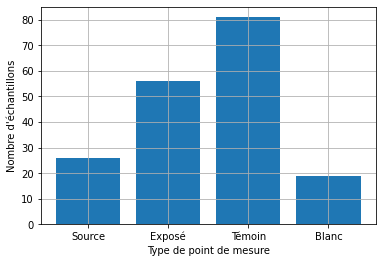

In [12]:
plt.bar(["Source", "Exposé", "Témoin", "Blanc"], [len(a), len(b), len(c), len(d)])
plt.xlabel("Type de point de mesure")
plt.ylabel("Nombre d'échantillons")
plt.grid()

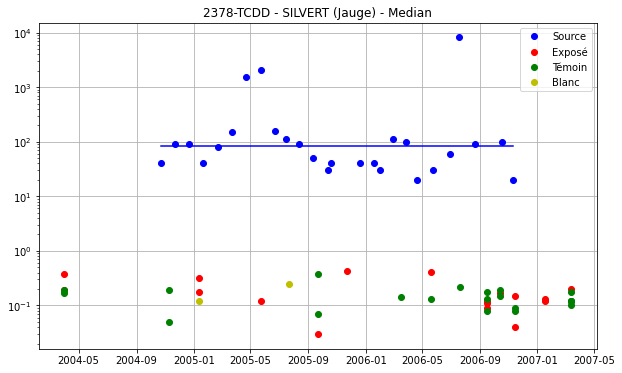

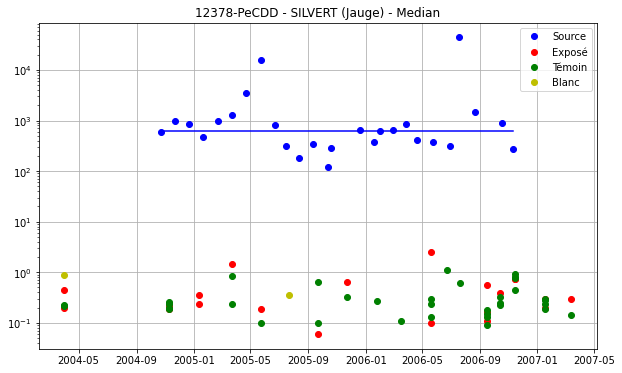

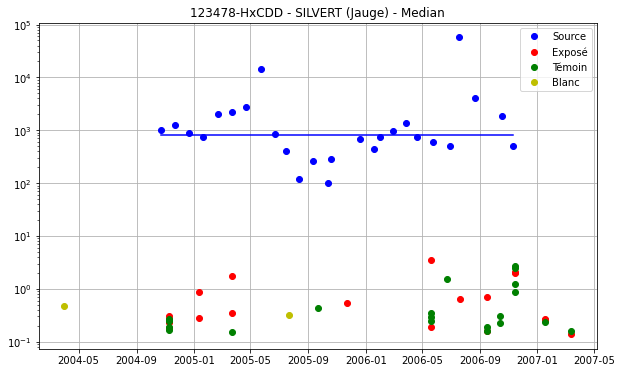

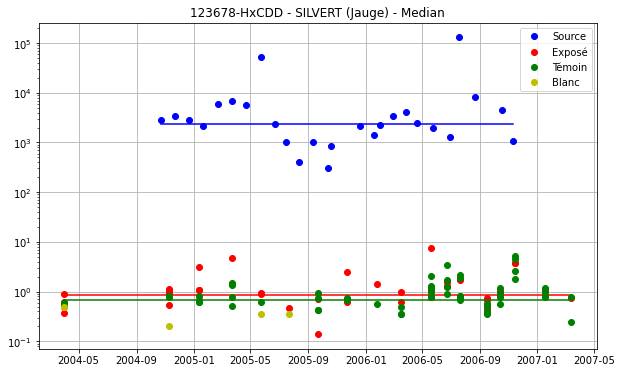

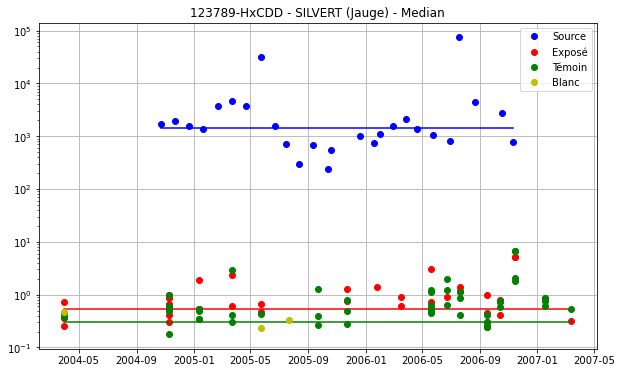

...

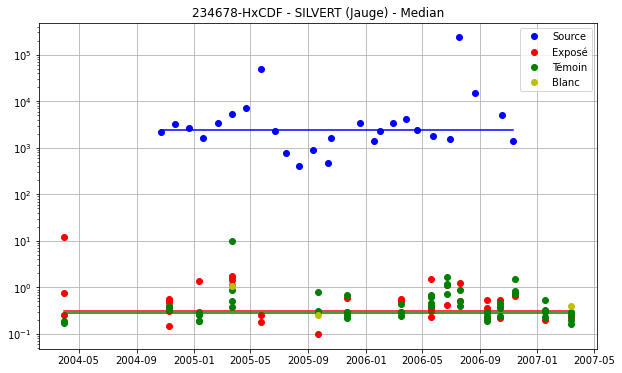

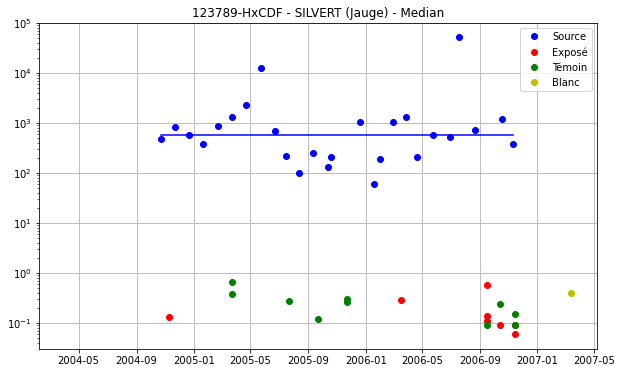

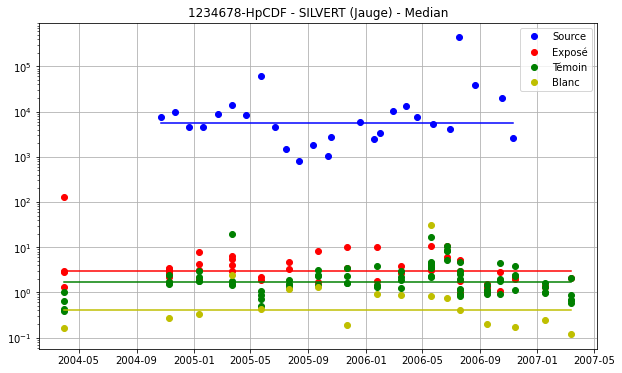

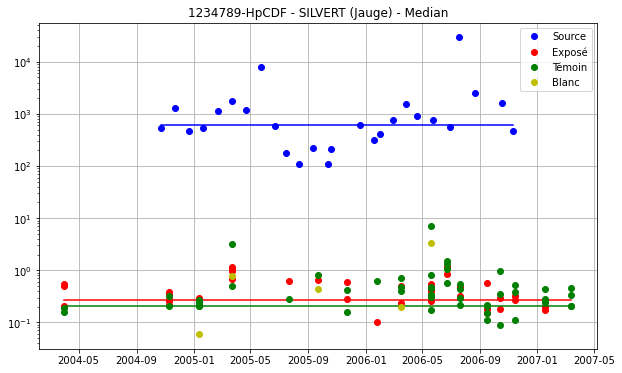

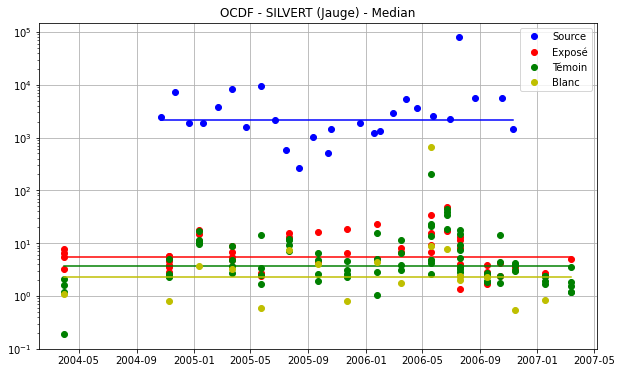

In [13]:
data_rapport = []
for sub in substances:
    f, ax = plt.subplots(figsize=(10, 6))
    plt.plot(a["Date"], a[sub].values * 1000, 'o', label="Source", color="b")
    plt.plot([min(a["Date"]), max(a["Date"])], [np.median(a[sub].values * 1000), np.median(a[sub].values * 1000)], color="b")
    plt.plot(b["Date"], b[sub].values, 'o',label="Exposé", color="r")
    plt.plot([min(b["Date"]), max(b["Date"])], [np.median(b[sub].values), np.median(b[sub].values)], color="r")
    plt.plot(c["Date"], c[sub].values, 'o',label="Témoin", color="g")
    plt.plot([min(c["Date"]), max(c["Date"])], [np.median(c[sub].values), np.median(c[sub].values)], color="g")
    plt.plot(d["Date"], d[sub].values, 'o',label="Blanc", color="y")
    plt.plot([min(d["Date"]), max(d["Date"])], [np.median(d[sub].values), np.median(d[sub].values)], color="y")
    plt.title(sub + " - SILVERT (Jauge) - Median")
    plt.legend()
    plt.grid()
    plt.yscale("log")
    plt.show()
    data_rapport.append(["SILVERT", "Jauge", sub, np.median(b[sub].values), np.median(c[sub].values), np.divide(np.median(b[sub].values), np.median(c[sub].values))])

In [14]:
list_total = []

a_bis = ["Source"] + list(np.mean(a[substances]).values * 1000)
list_total.append(a_bis)

b_bis = ["Exposé"] + list(np.mean(b[substances]).values)
list_total.append(b_bis)

c_bis = ["Témoin"] + list(np.mean(c[substances]).values)
list_total.append(c_bis)

d_bis = ["Blanc"] + list(np.mean(d[substances]).values)
list_total.append(d_bis)

df = pd.DataFrame(columns=(["Type"] + substances), data=list_total)
df

,Type,2378-TCDD,12378-PeCDD,123478-HxCDD,123678-HxCDD,123789-HxCDD,1234678-HpCDD,OCDD,2378-TCDF,12378-PeCDF,23478-PeCDF,123478-HxCDF,123678-HxCDF,234678-HxCDF,123789-HxCDF,1234678-HpCDF,1234789-HpCDF,OCDF
0,Source,511.153846,2967.692308,3708.846154,9684.230769,5635.769231,38993.846154,36916.538462,3245.000000,4884.230769,11961.153846,9400.769231,9896.538462,13755.000000,3045.384615,26258.076923,2155.384615,5963.076923
1,Exposé,0.056964,0.187679,0.271071,1.118571,0.766250,17.318393,107.221786,0.676786,0.290000,0.615536,0.484286,0.451964,0.658571,0.026250,5.761250,0.310536,8.407143
2,Témoin,0.038025,0.144444,0.153457,0.787407,0.571605,11.002593,55.122716,0.780000,0.312099,0.681975,0.496914,0.445309,0.454321,0.031728,2.588889,0.381235,9.403951
3,Blanc,0.019474,0.065263,0.042105,0.074737,0.054211,0.699474,2.171579,0.244737,0.094737,0.226316,0.115789,0.062105,0.090000,0.020526,2.182105,0.251053,37.828947


## III.b Distance

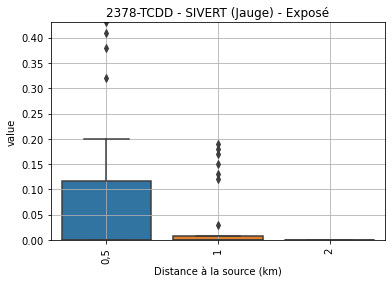

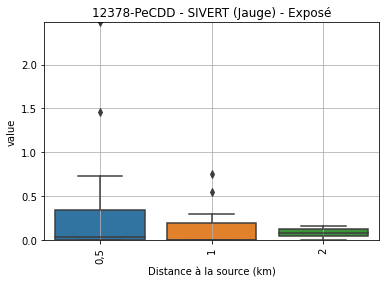

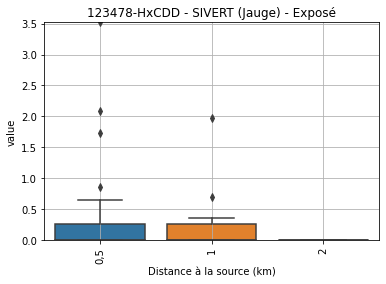

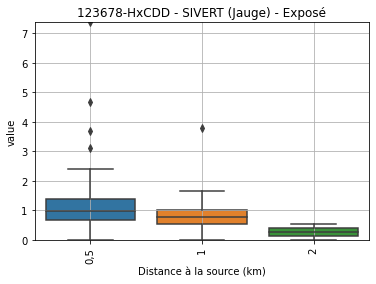

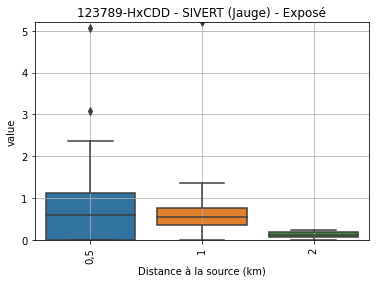

...

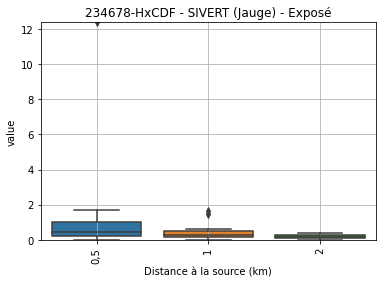

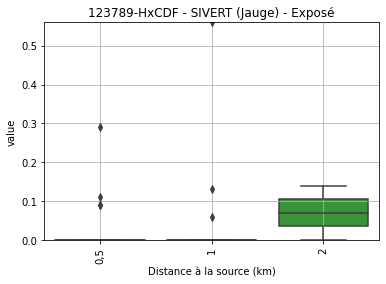

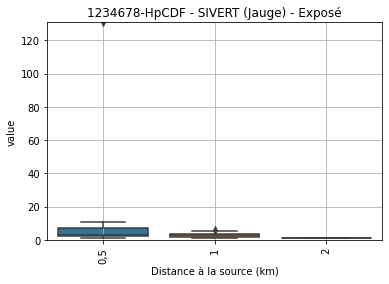

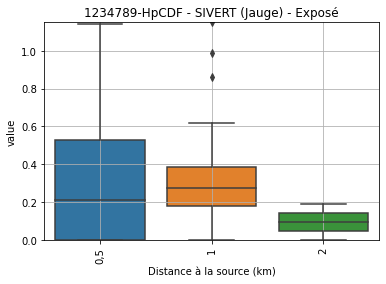

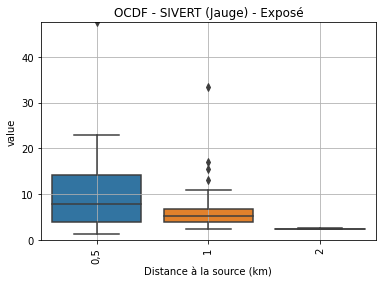

In [15]:
for sub in substances:
    data_extract = pd.melt(b[[sub, 'Distance à la source (km)']], id_vars=['Distance à la source (km)'], var_name='Substance')
    X='Distance à la source (km)'
    Y='value'
    sns.boxplot(x=X, y=Y, data=data_extract)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 10, rotation=90)
    plt.yticks(fontsize = 10)
    plt.title(sub + " - SIVERT (Jauge) - Exposé")
    plt.ylim(0, min(150, max(data_extract["value"])))
    plt.grid()
    plt.show()

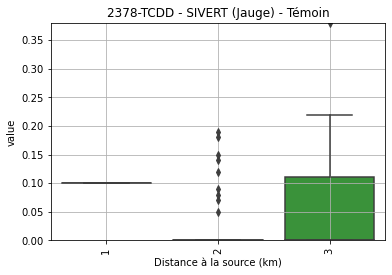

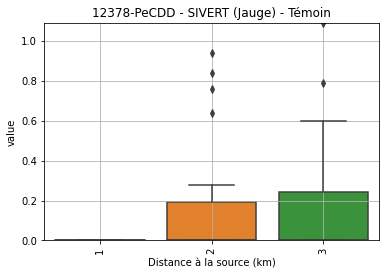

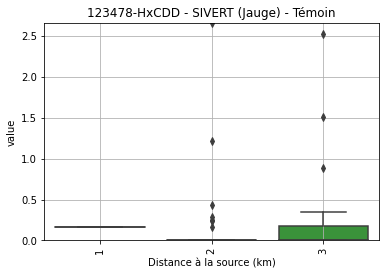

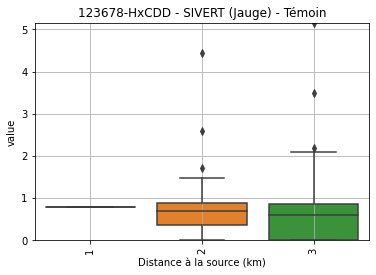

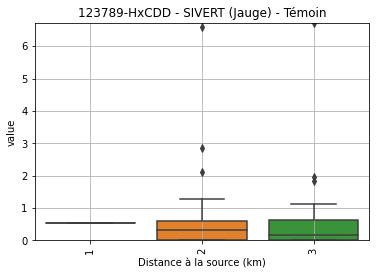

...

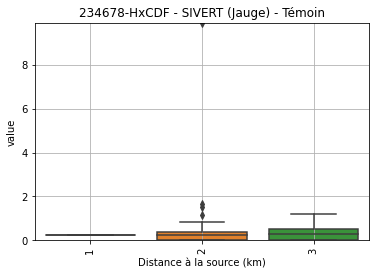

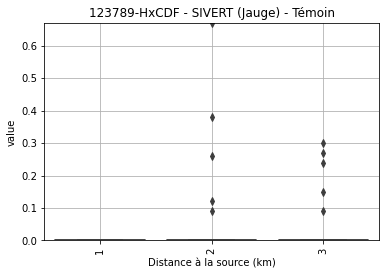

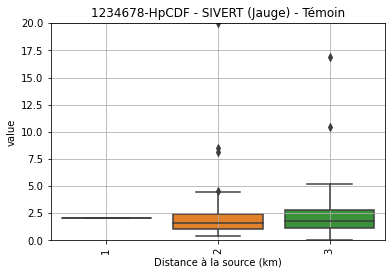

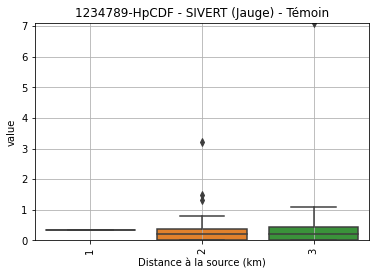

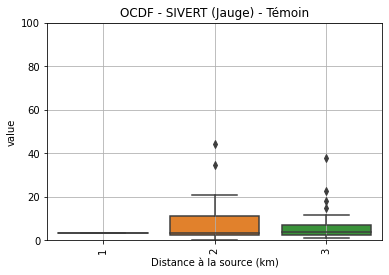

In [16]:
for sub in substances:
    data_extract = pd.melt(c[[sub, 'Distance à la source (km)']], id_vars=['Distance à la source (km)'], var_name='Substance')
    X='Distance à la source (km)'
    Y='value'
    sns.boxplot(x=X, y=Y, data=data_extract)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 10, rotation=90)
    plt.yticks(fontsize = 10)
    plt.xlim()
    plt.title(sub + " - SIVERT (Jauge) - Témoin")
    plt.grid()
    plt.ylim(0, min(100, max(data_extract["value"])))
    plt.show()

## III.c Seconde analyse Jauge

In [17]:
b = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Exposé") & (data["Unités"] == "pg/m2/jour") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)","Date de mesure :  Début"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Témoin") & (data["Unités"] == "pg/m2/jour") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

d = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Blanc") & (data["Unités"] == "pg/m2/jour") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]]
d["Date"] = [dt.datetime.strptime(i,'%d/%m/%Y').date() for i in d["Date de mesure :  Début"]]
d = d.sort_values(by=["Date"])

## III.d Seconde analyse Jauge

In [18]:
list_median = []
for sub in substances:
    list_median.append([sub, np.median(b[sub]), np.median(c[sub])]) 

In [19]:
pd.DataFrame(data=list_median, columns=["Substances", "Mediane Exposé", "Médiane Témoin"])

,Substances,Mediane Exposé,Médiane Témoin
0,2378-TCDD,0.00,0.000
1,12378-PeCDD,0.42,0.000
2,123478-HxCDD,0.30,0.000
3,123678-HxCDD,8.92,6.005
4,123789-HxCDD,3.64,5.030
5,1234678-HpCDD,23.02,27.345
6,OCDD,68.69,79.520
7,2378-TCDF,0.70,1.700
8,12378-PeCDF,0.66,0.925
9,23478-PeCDF,1.03,1.665


# IV. Valeurs brutes (SIVERT - Autres)

## IV.a Etude selon la matrice

In [20]:
matrice = "Ray grass"
unit1 = "ng/kg MS"
unit2 = "pg/g MS"

In [21]:
b = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Exposé") & ((data["Unités"] == unit2) | (data["Unités"] == unit1))][substances + ["Distance à la source (km)","Date de mesure :  Début", "Matrice"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Témoin") & ((data["Unités"] == unit2) | (data["Unités"] == unit1))][substances + ["Distance à la source (km)", "Date de mesure :  Début", "Matrice"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

d = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Blanc") & ((data["Unités"] == unit2) | (data["Unités"] == unit1))][substances + ["Distance à la source (km)", "Date de mesure :  Début", "Matrice"]]
d["Date"] = [dt.datetime.strptime(i,'%d/%m/%Y').date() for i in d["Date de mesure :  Début"]]
d = d.sort_values(by=["Date"])

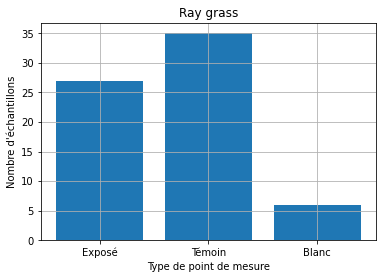

In [22]:
plt.bar(["Exposé", "Témoin", "Blanc"], [len(b), len(c), len(d)])
plt.xlabel("Type de point de mesure")
plt.ylabel("Nombre d'échantillons")
plt.title(matrice)
plt.grid()

In [23]:
list_median = []
list_matrice = ["Laitue", "Lichen", "Ray grass"]
for sub in substances:
    for matrice in list_matrice:
        data_b = b[b["Matrice"] == matrice]
        data_c = c[c["Matrice"] == matrice]
        data_d = d[d["Matrice"] == matrice]
        median_coef = [matrice, sub, np.median(data_b[sub]), np.median(data_c[sub]), np.median(data_d[sub])]
        list_median.append(median_coef)

In [24]:
result = pd.DataFrame(data=list_median, columns=["Matrice" , "Substances", "Mediane Exposé", "Médiane Témoin", "Mediane Blanc"])
result[(result["Substances"] == "OCDD") | (result["Substances"] == "OCDF")]

,Matrice,Substances,Mediane Exposé,Médiane Témoin,Mediane Blanc
18,Laitue,OCDD,15.780,4.420,3.78
19,Lichen,OCDD,730.795,112.215,NaN
20,Ray grass,OCDD,16.215,3.930,4.27
48,Laitue,OCDF,1.480,0.525,1.08
49,Lichen,OCDF,47.665,4.575,NaN
50,Ray grass,OCDF,2.330,0.720,1.83


## IV.b Temporalité (Matrice : Lichen)

In [25]:
matrice = "Lichen"
unit1 = "ng/kg MS"
unit2 = "pg/g MS"

In [26]:
b = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Exposé") & ((data["Unités"] == unit2) | (data["Unités"] == unit1)) & (data["Matrice"] == matrice)][substances + ["Distance à la source (km)","Date de mesure :  Début", "Matrice"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Témoin") & ((data["Unités"] == unit2) | (data["Unités"] == unit1)) & (data["Matrice"] == matrice)][substances + ["Distance à la source (km)", "Date de mesure :  Début", "Matrice"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

d = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Blanc") & ((data["Unités"] == unit2) | (data["Unités"] == unit1)) & (data["Matrice"] == matrice)][substances + ["Distance à la source (km)", "Date de mesure :  Début", "Matrice"]]
d["Date"] = [dt.datetime.strptime(i,'%d/%m/%Y').date() for i in d["Date de mesure :  Début"]]
d = d.sort_values(by=["Date"])

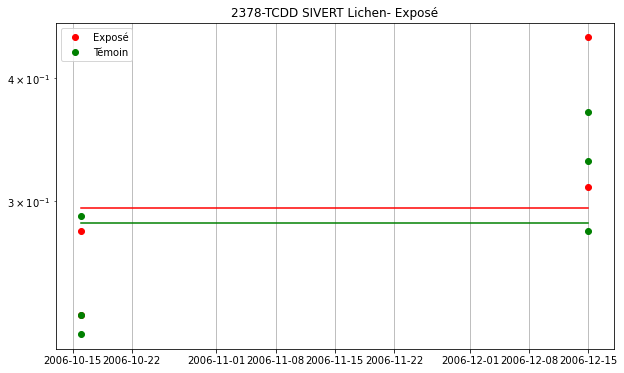

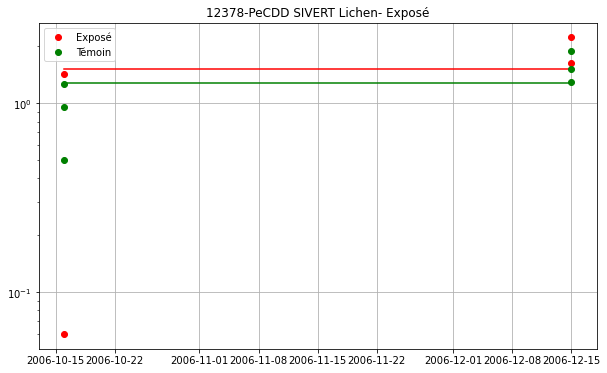

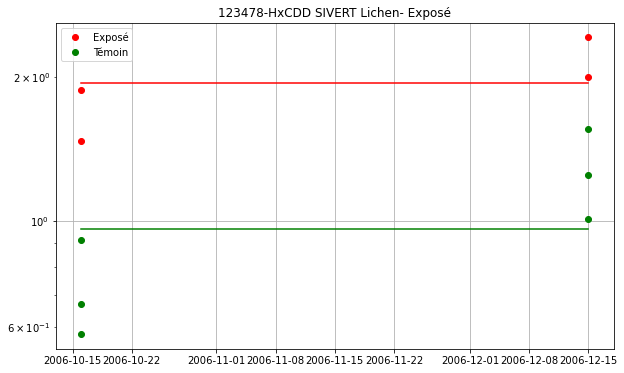

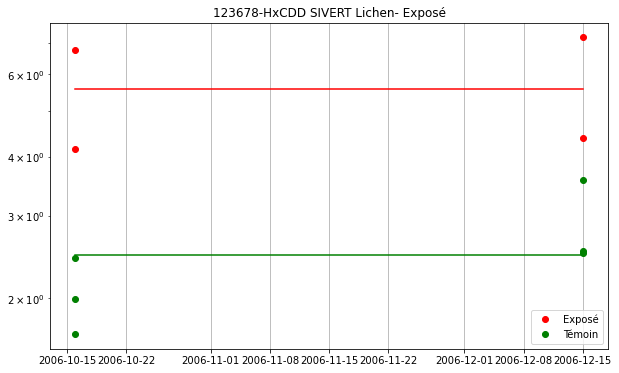

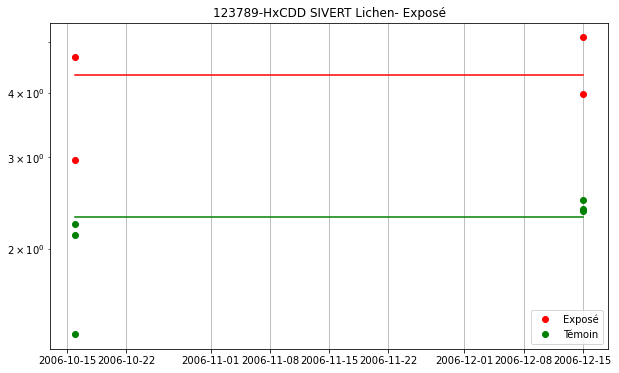

...

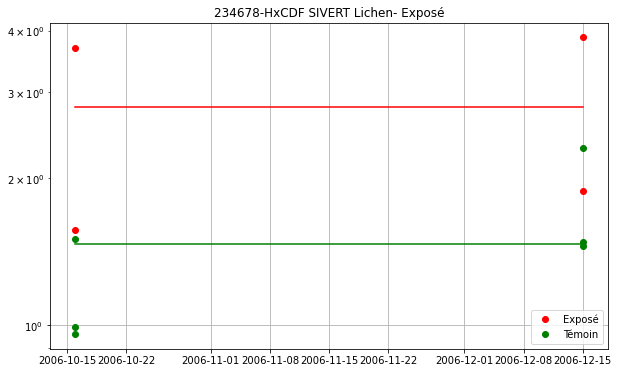

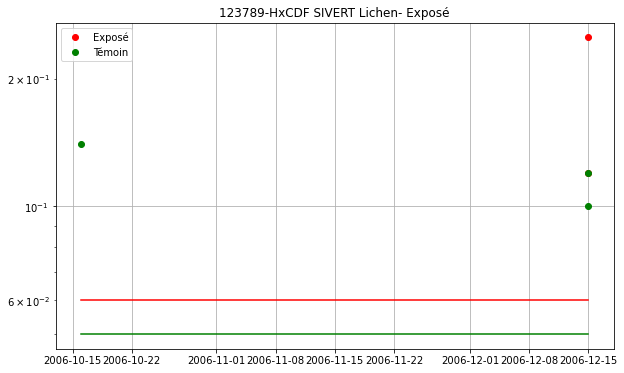

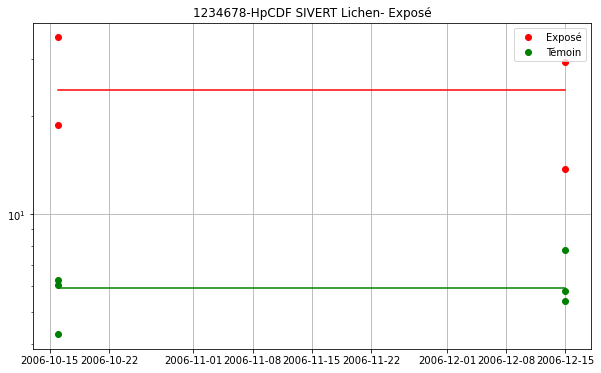

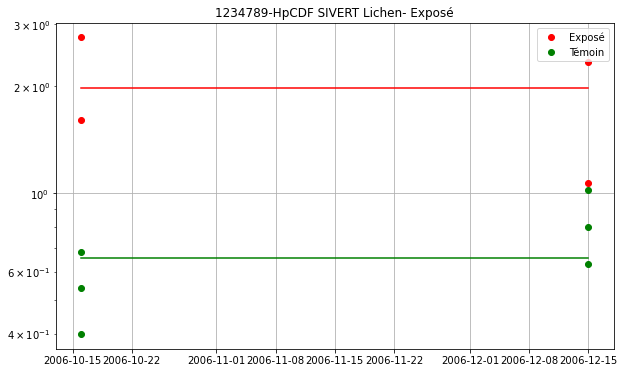

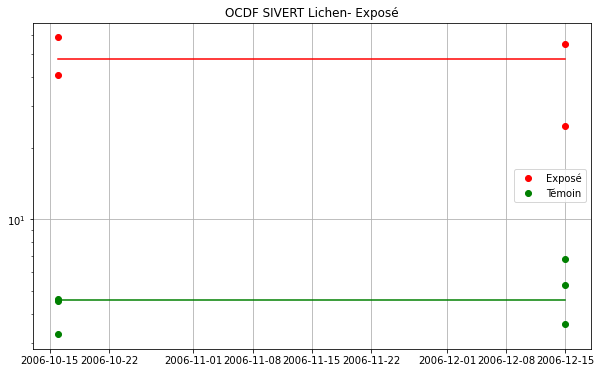

In [27]:
for sub in substances:
    f, ax = plt.subplots(figsize=(10, 6))
    plt.plot(b["Date"], b[sub].values, 'o',label="Exposé", color="r")
    plt.plot([min(b["Date"]), max(b["Date"])], [np.median(b[sub].values), np.median(b[sub].values)], color="r")
    plt.plot(c["Date"], c[sub].values, 'o',label="Témoin", color="g")
    plt.plot([min(c["Date"]), max(c["Date"])], [np.median(c[sub].values), np.median(c[sub].values)], color="g")
    plt.title(sub + " SIVERT " + matrice + "- Exposé")
    plt.legend()
    plt.grid()
    plt.yscale("log")
    plt.show()
    data_rapport.append(["SILVERT", "Lichen", sub, np.median(b[sub].values), np.median(c[sub].values), np.divide(np.median(b[sub].values), np.median(c[sub].values))])

## IV.c Distance (Matrice : Lichen)

### Exposé

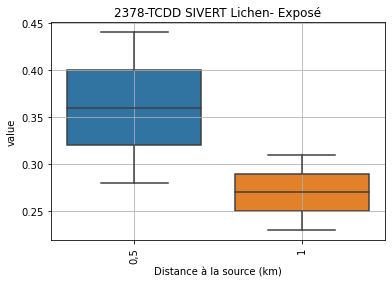

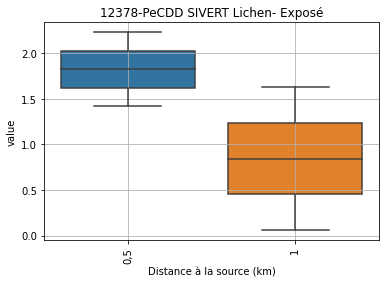

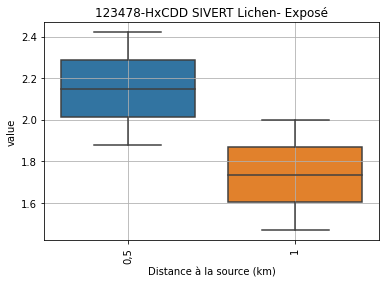

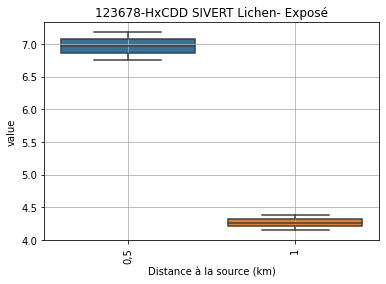

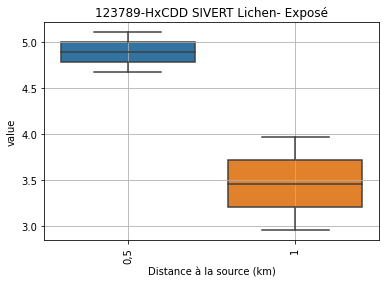

...

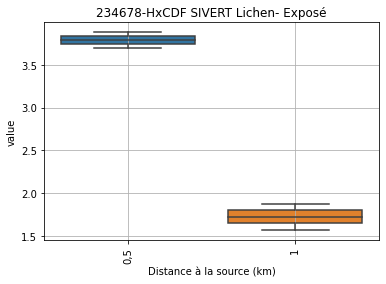

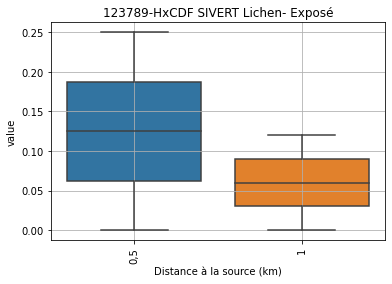

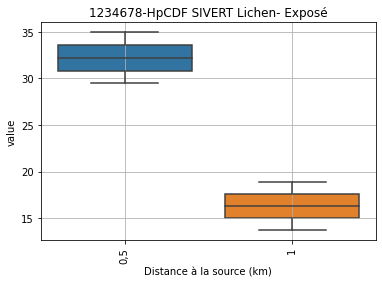

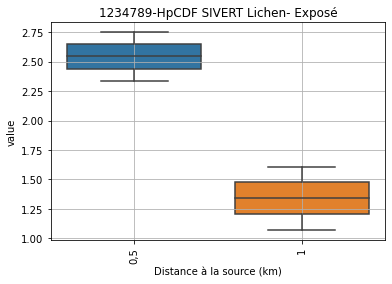

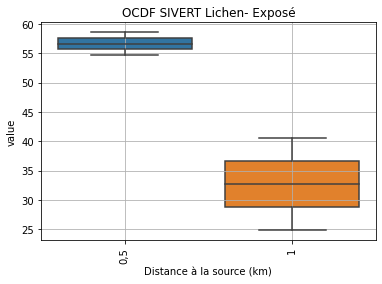

In [28]:
for sub in substances:
    data_extract = pd.melt(b[[sub, 'Distance à la source (km)']], id_vars=['Distance à la source (km)'], var_name='Substance')
    X='Distance à la source (km)'
    Y='value'
    sns.boxplot(x=X, y=Y, data=data_extract)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 10, rotation=90)
    plt.yticks(fontsize = 10)
    plt.xlim()
    plt.title(sub + " SIVERT " + matrice + "- Exposé")
    plt.grid()
    plt.show()

### Témoin

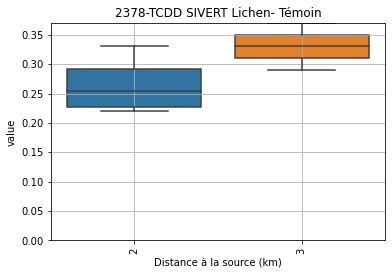

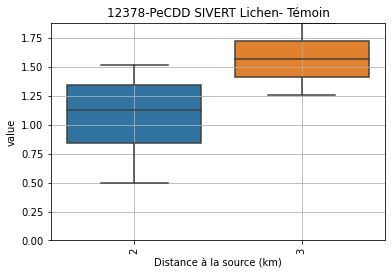

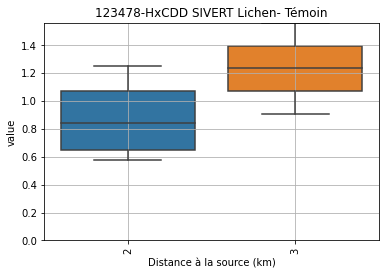

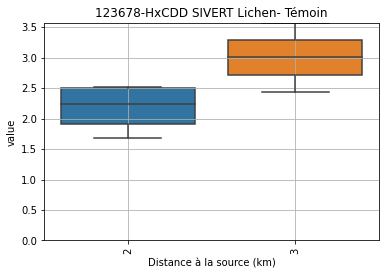

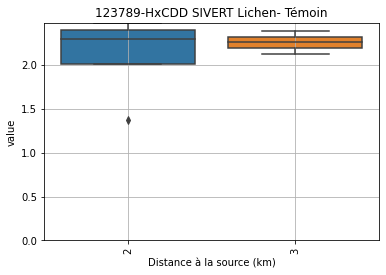

...

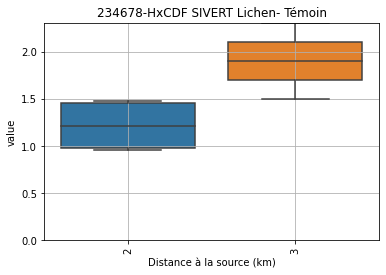

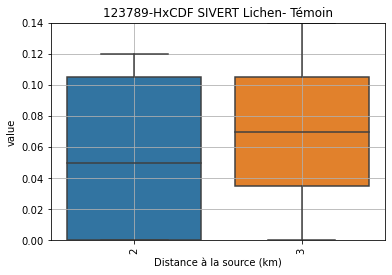

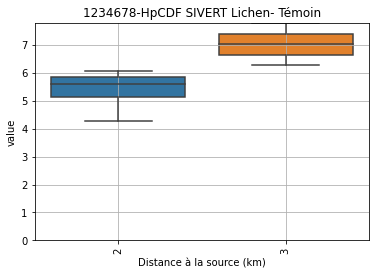

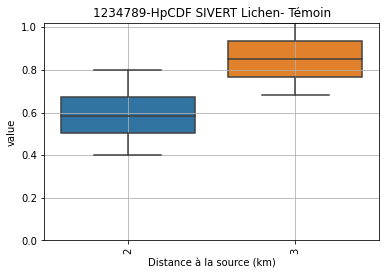

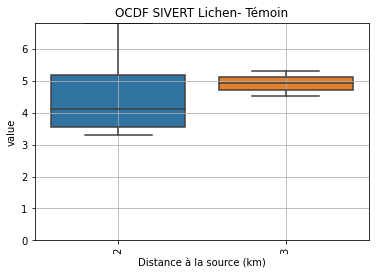

In [29]:
for sub in substances:
    data_extract = pd.melt(c[[sub, 'Distance à la source (km)']], id_vars=['Distance à la source (km)'], var_name='Substance')
    X='Distance à la source (km)'
    Y='value'
    sns.boxplot(x=X, y=Y, data=data_extract)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 10, rotation=90)
    plt.yticks(fontsize = 10)
    plt.xlim()
    plt.title(sub + " SIVERT " + matrice + "- Témoin")
    plt.grid()
    plt.ylim(0, min(100, max(data_extract["value"])))
    plt.show()

## IV.d Temporalité (Matrice : Laitue + Ray grass)

In [30]:
matrice = "Ray grass"
matrice_bis = "Laitue"
unit1 = "ng/kg MS"
unit2 = "pg/g MS"

In [31]:
b = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Exposé") & ((data["Unités"] == unit2) | (data["Unités"] == unit1)) & ((data["Matrice"] == matrice) | (data["Matrice"] == matrice_bis))][substances + ["Distance à la source (km)","Date de mesure :  Début", "Matrice"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Témoin") & ((data["Unités"] == unit2) | (data["Unités"] == unit1)) & ((data["Matrice"] == matrice) | (data["Matrice"] == matrice_bis))][substances + ["Distance à la source (km)", "Date de mesure :  Début", "Matrice"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

d = data[(data["Nom du projet"] == "SIVERT") & (data["Type de point de mesure"] == "Blanc") & ((data["Unités"] == unit2) | (data["Unités"] == unit1)) & ((data["Matrice"] == matrice) | (data["Matrice"] == matrice_bis))][substances + ["Distance à la source (km)", "Date de mesure :  Début", "Matrice"]]
d["Date"] = [dt.datetime.strptime(i,'%d/%m/%Y').date() for i in d["Date de mesure :  Début"]]
d = d.sort_values(by=["Date"])

### Exposé

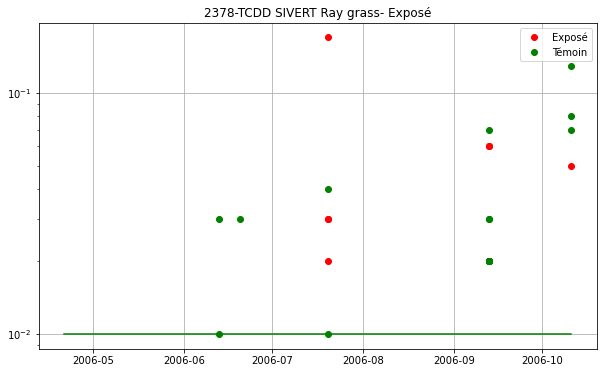

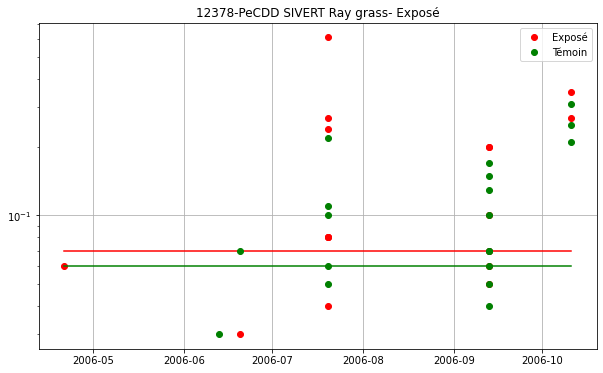

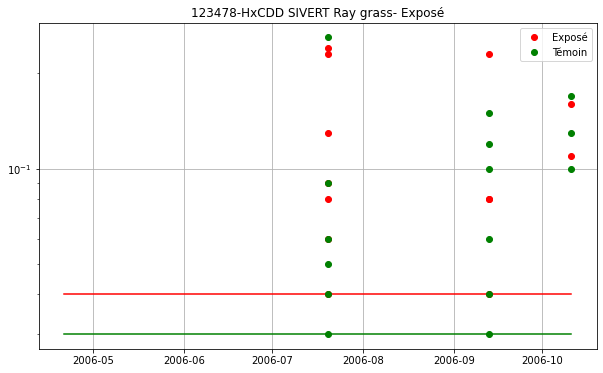

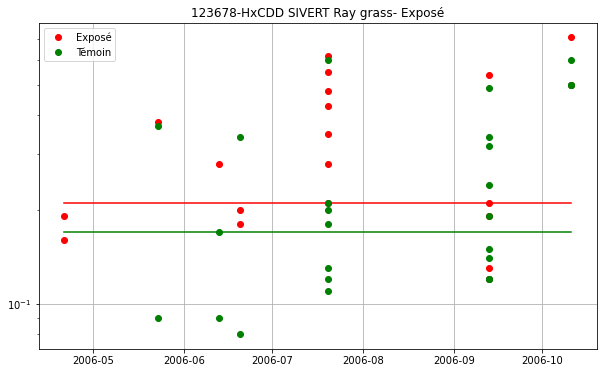

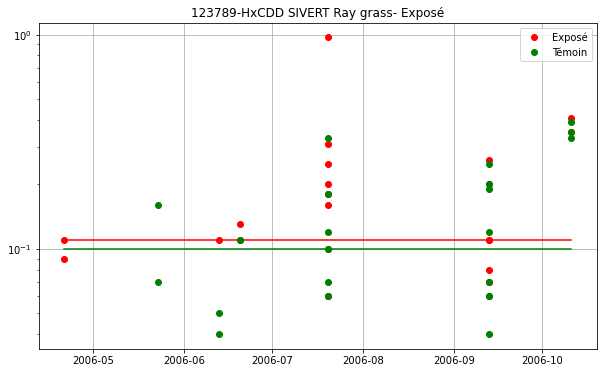

...

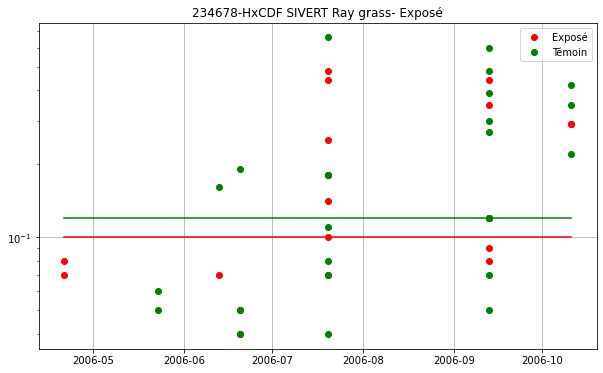

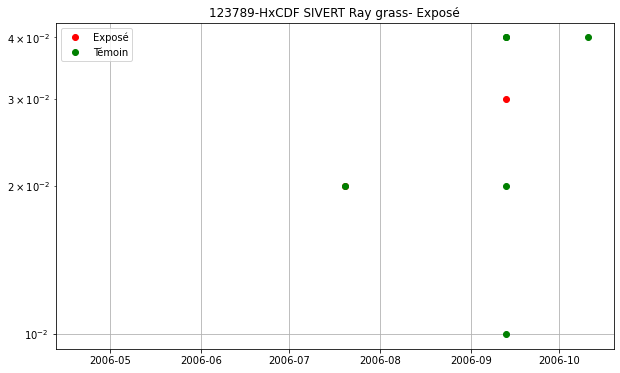

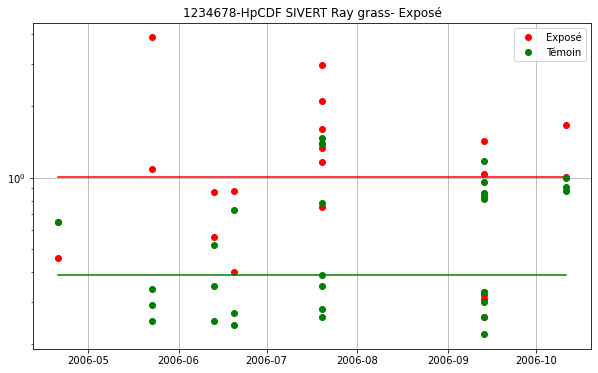

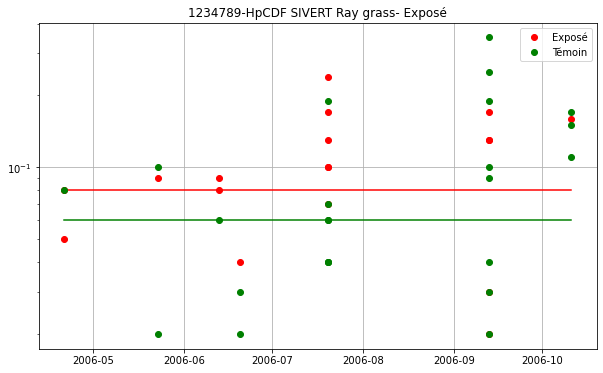

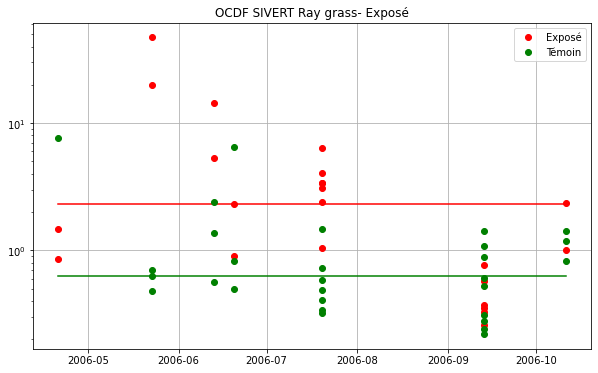

In [32]:
for sub in substances:
    f, ax = plt.subplots(figsize=(10, 6))
    plt.plot(b["Date"], b[sub].values, 'o',label="Exposé", color="r")
    plt.plot([min(b["Date"]), max(b["Date"])], [np.median(b[sub].values), np.median(b[sub].values)], color="r")
    plt.plot(c["Date"], c[sub].values, 'o',label="Témoin", color="g")
    plt.plot([min(c["Date"]), max(c["Date"])], [np.median(c[sub].values), np.median(c[sub].values)], color="g")
    plt.title(sub + " SIVERT " + matrice + "- Exposé")
    plt.legend()
    plt.grid()
    plt.yscale("log")
    plt.show()
    data_rapport.append(["SILVERT", "Ray grass & Laitue", sub, np.median(b[sub].values), np.median(c[sub].values), np.divide(np.median(b[sub].values), np.median(c[sub].values))])

## IV.e Distance (Matrice : Laitue + Ray grass)

### Exposé

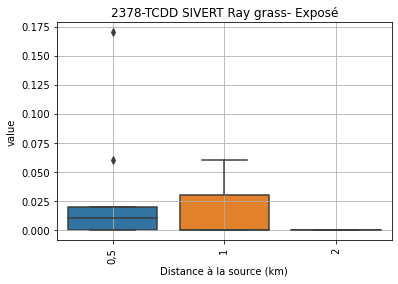

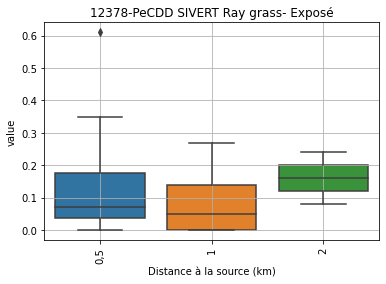

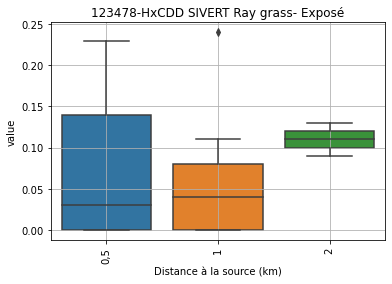

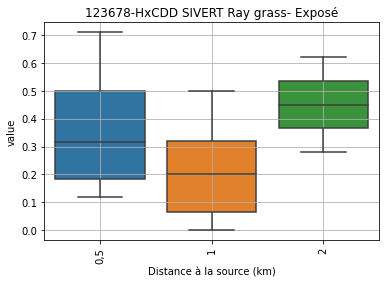

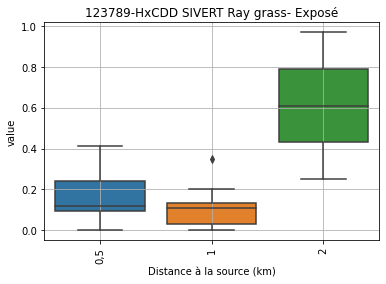

...

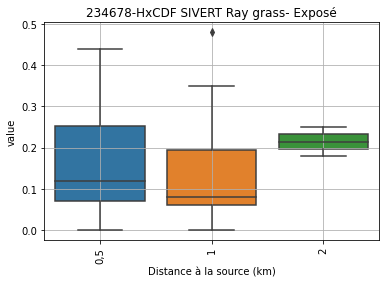

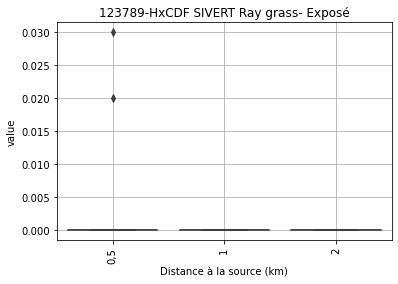

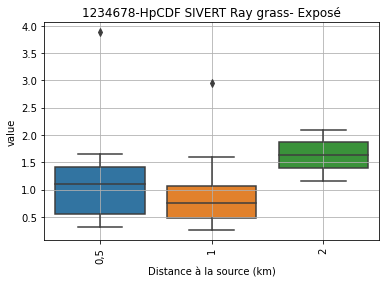

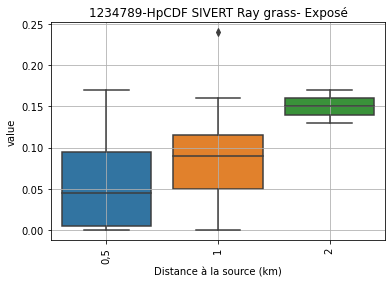

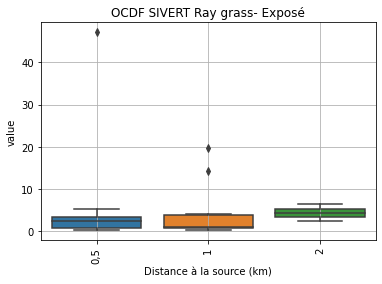

In [33]:
for sub in substances:
    data_extract = pd.melt(b[[sub, 'Distance à la source (km)']], id_vars=['Distance à la source (km)'], var_name='Substance')
    X='Distance à la source (km)'
    Y='value'
    sns.boxplot(x=X, y=Y, data=data_extract)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 10, rotation=90)
    plt.yticks(fontsize = 10)
    plt.xlim()
    plt.title(sub + " SIVERT " + matrice + "- Exposé")
    plt.grid()
    plt.show()

### Témoin

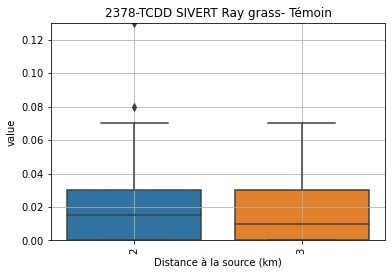

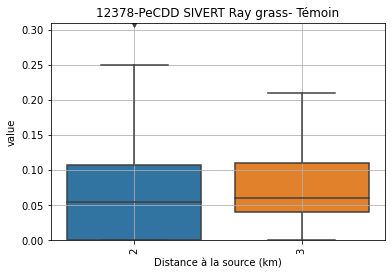

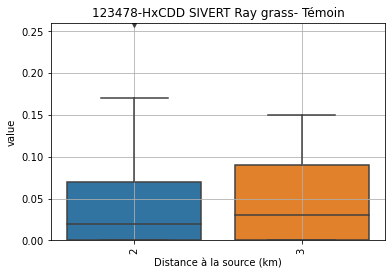

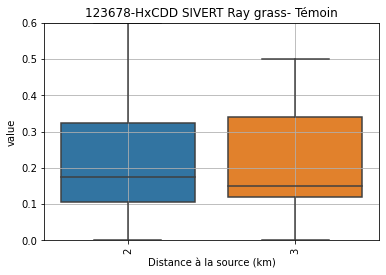

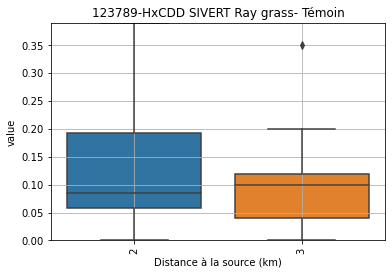

...

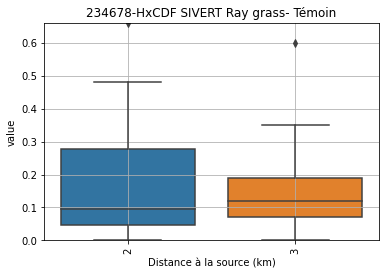

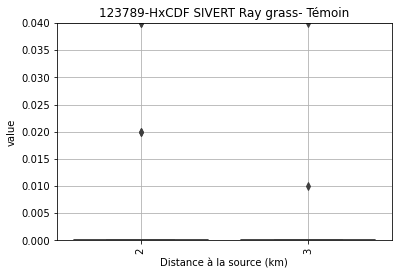

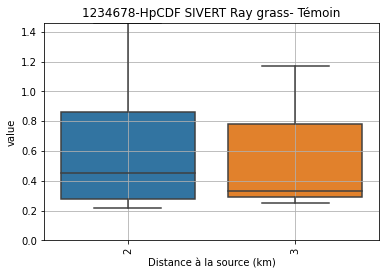

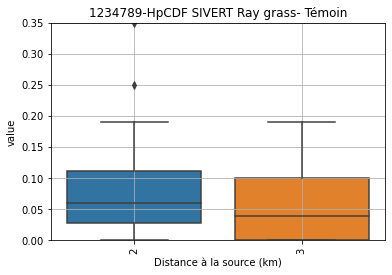

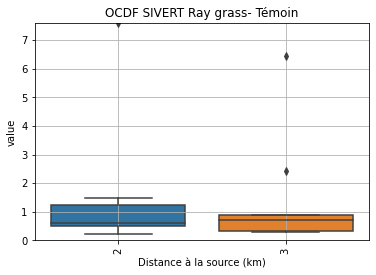

In [34]:
for sub in substances:
    data_extract = pd.melt(c[[sub, 'Distance à la source (km)']], id_vars=['Distance à la source (km)'], var_name='Substance')
    X='Distance à la source (km)'
    Y='value'
    sns.boxplot(x=X, y=Y, data=data_extract)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 10, rotation=90)
    plt.yticks(fontsize = 10)
    plt.xlim()
    plt.title(sub + " SIVERT " + matrice + "- Témoin")
    plt.grid()
    plt.ylim(0, min(100, max(data_extract["value"])))
    plt.show()

## IV.f Tableaux récapitulatifs

In [35]:
df_rapport = pd.DataFrame(data = data_rapport, columns = ["Project", "Matrice", "Substance", "Exposé", "Témoin", "Rapport"])
df_final_rapport = df_rapport[df_rapport["Project"] == "SIVERT"].pivot(index="Substance", columns="Matrice", values='Rapport')
df_final_rapport.reindex(substances)

Matrice
Substance
2378-TCDD
12378-PeCDD
123478-HxCDD
123678-HxCDD
123789-HxCDD
1234678-HpCDD
OCDD
2378-TCDF
12378-PeCDF


In [36]:
df_final_rapport = df_rapport.pivot(index="Substance", columns="Matrice", values='Exposé')
df_final_rapport.reindex(substances)

Matrice,Jauge,Lichen,Ray grass & Laitue
Substance,,,
2378-TCDD,0.000,0.295,0.00
12378-PeCDD,0.000,1.525,0.07
123478-HxCDD,0.000,1.940,0.04
123678-HxCDD,0.870,5.570,0.21
123789-HxCDD,0.540,4.325,0.11
1234678-HpCDD,10.725,91.970,2.97
OCDD,59.820,730.795,15.78
2378-TCDF,0.575,2.585,0.21
12378-PeCDF,0.260,1.895,0.08


In [37]:
df_final_rapport = df_rapport.pivot(index="Substance", columns="Matrice", values='Témoin')
df_final_rapport.reindex(substances)

Matrice,Jauge,Lichen,Ray grass & Laitue
Substance,,,
2378-TCDD,0.00,0.285,0.01
12378-PeCDD,0.00,1.275,0.06
123478-HxCDD,0.00,0.960,0.03
123678-HxCDD,0.67,2.470,0.17
123789-HxCDD,0.31,2.300,0.10
1234678-HpCDD,6.41,23.795,1.12
OCDD,18.58,112.215,4.23
2378-TCDF,0.64,2.810,0.19
12378-PeCDF,0.30,1.950,0.09


# V. Mersen projet

## V.a Temporalité

In [38]:
b = data[(data["Nom du projet"] == "Mersen") & (data["Type de point de mesure"] == "Exposé") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)","Date de mesure :  Début"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "Mersen") & (data["Type de point de mesure"] == "Témoin") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

d = data[(data["Nom du projet"] == "Mersen") & (data["Type de point de mesure"] == "Blanc") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]]
d["Date"] = [dt.datetime.strptime(i,'%d/%m/%Y').date() for i in d["Date de mesure :  Début"]]
d = d.sort_values(by=["Date"])

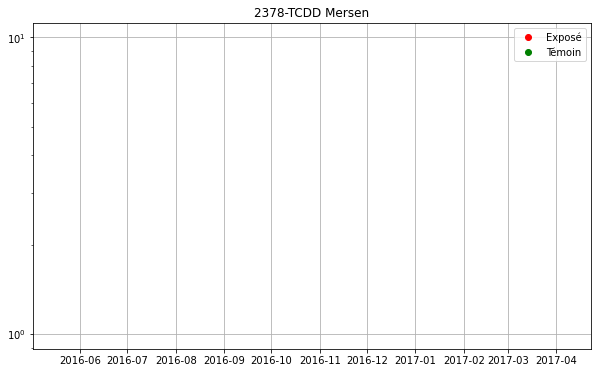

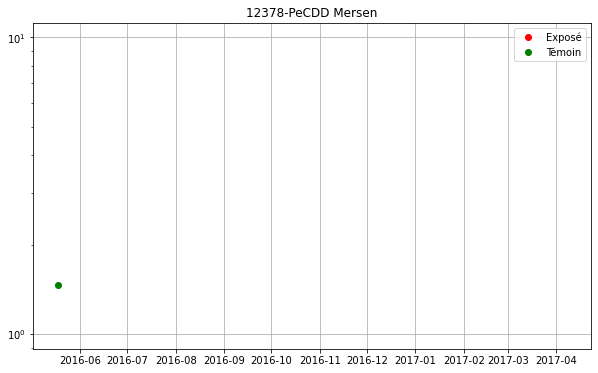

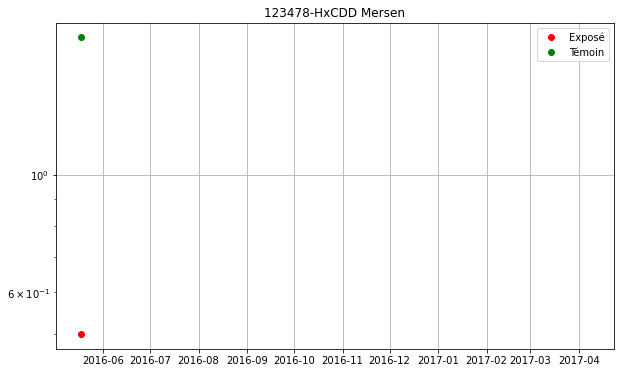

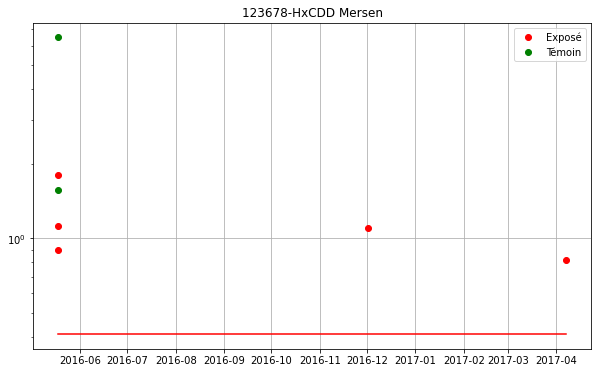

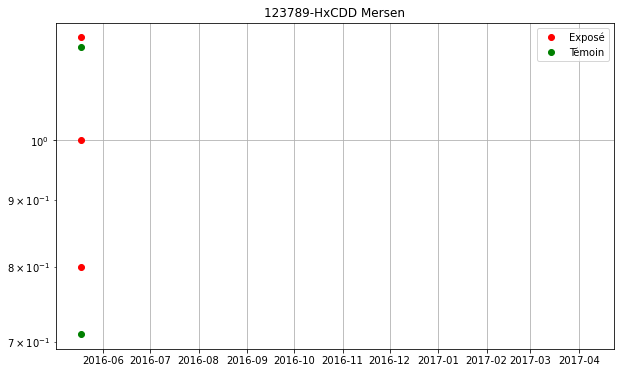

...

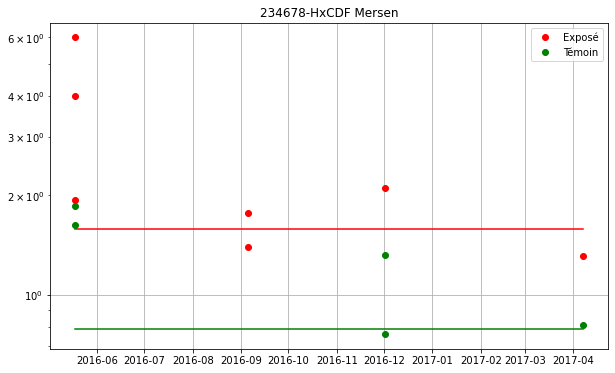

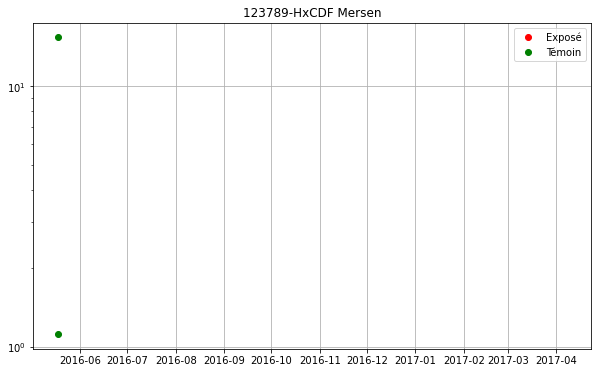

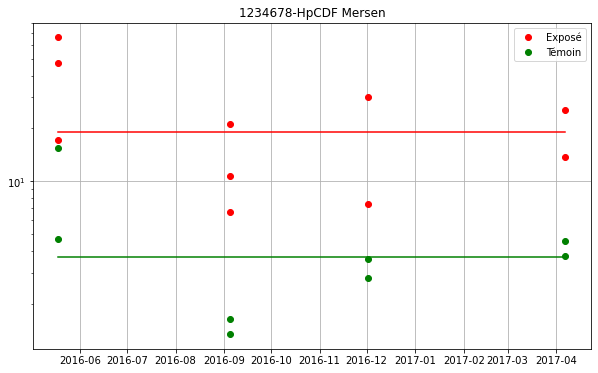

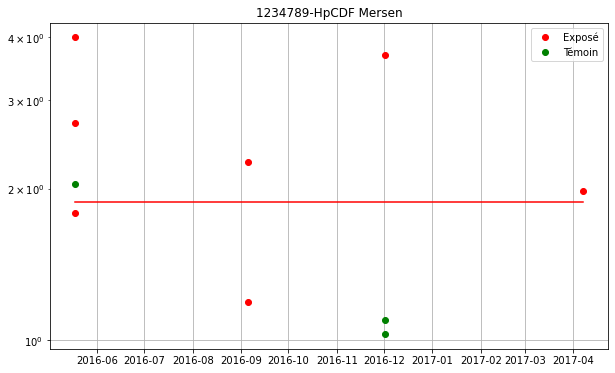

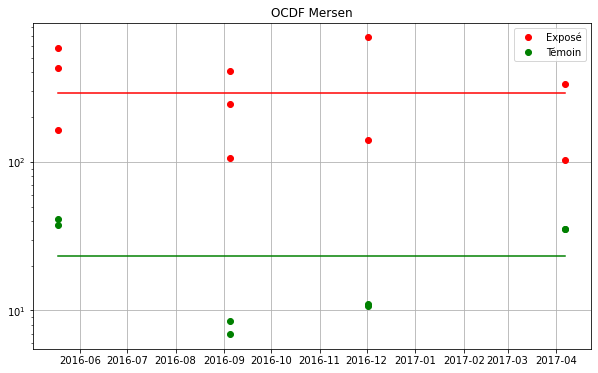

In [39]:
for sub in substances:
    f, ax = plt.subplots(figsize=(10, 6))
    plt.plot(b["Date"], b[sub].values, 'o',label="Exposé", color="r")
    plt.plot([min(b["Date"]), max(b["Date"])], [np.median(b[sub].values), np.median(b[sub].values)], color="r")
    plt.plot(c["Date"], c[sub].values, 'o',label="Témoin", color="g")
    plt.plot([min(c["Date"]), max(c["Date"])], [np.median(c[sub].values), np.median(c[sub].values)], color="g")
    plt.title(sub + " Mersen")
    plt.legend()
    plt.grid()
    plt.yscale("log")
    plt.show()
    data_rapport.append(["Mersen", "Jauge", sub, np.median(b[sub].values), np.median(c[sub].values), np.divide(np.median(b[sub].values), np.median(c[sub].values))])

## V.b Tableau récapitulatif

In [40]:
df_rapport = pd.DataFrame(data = data_rapport, columns = ["Project", "Matrice", "Substance", "Exposé", "Témoin", "Rapport"])
df_final_rapport = df_rapport[df_rapport["Project"] == "Mersen"].pivot(index="Substance", columns="Matrice", values='Rapport')
df_final_rapport.reindex(substances)

Matrice,Jauge
Substance,
2378-TCDD,NaN
12378-PeCDD,NaN
123478-HxCDD,NaN
123678-HxCDD,inf
123789-HxCDD,NaN
1234678-HpCDD,1.232935
OCDD,1.521964
2378-TCDF,1.941176
12378-PeCDF,NaN


# VI. Projet Novergie

## VI.a Temporalité (Unité : pg/echantillon)

In [41]:
b = data[(data["Nom du projet"] == "Novergie") & (data["Type de point de mesure"] == "Exposé") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)","Date de mesure :  Début"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "Novergie") & (data["Type de point de mesure"] == "Témoin") & (data["Unités"] == "pg/echantillon") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

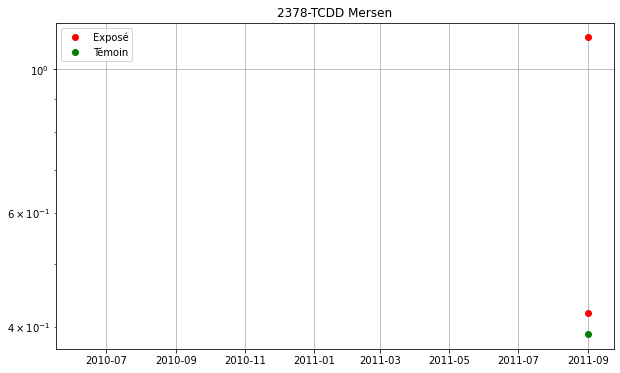

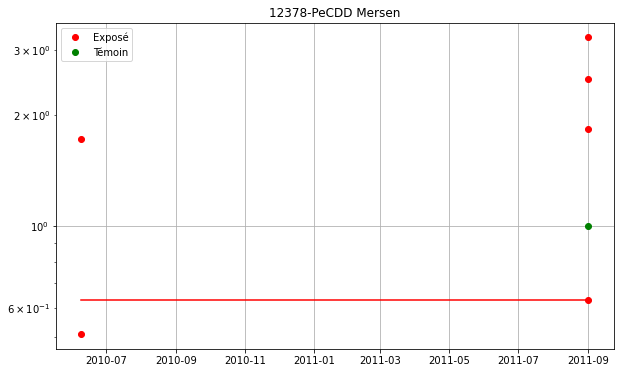

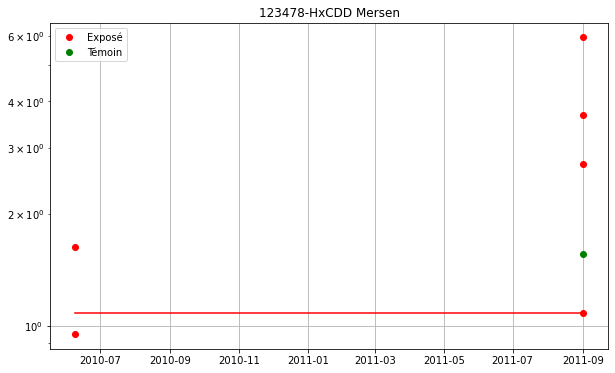

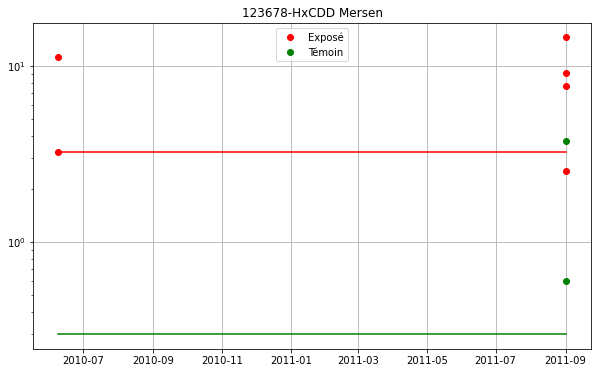

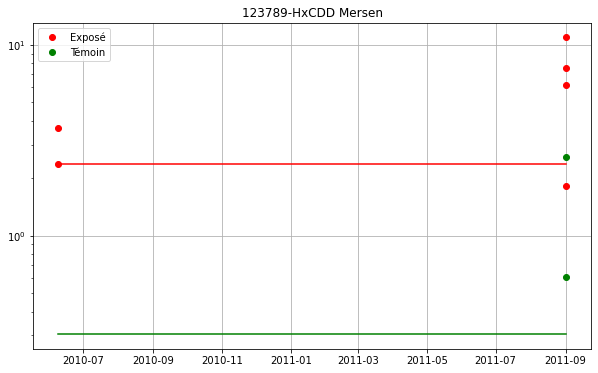

...

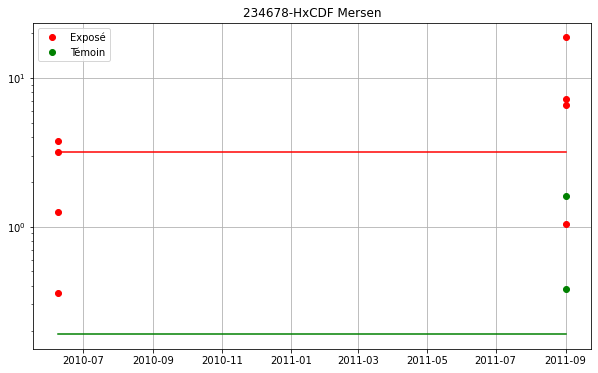

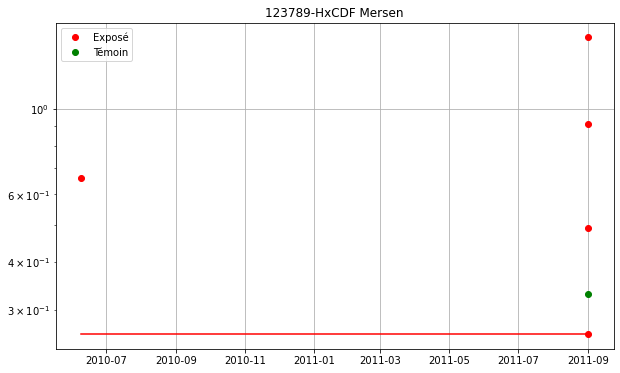

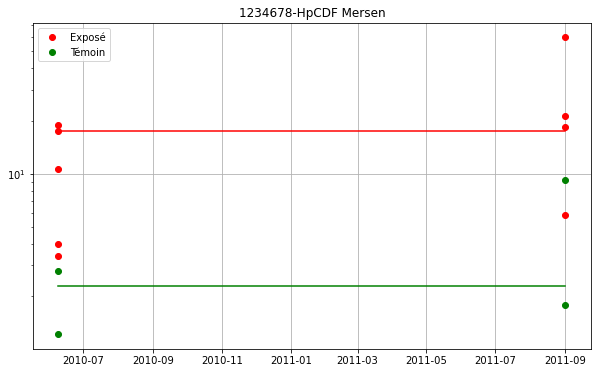

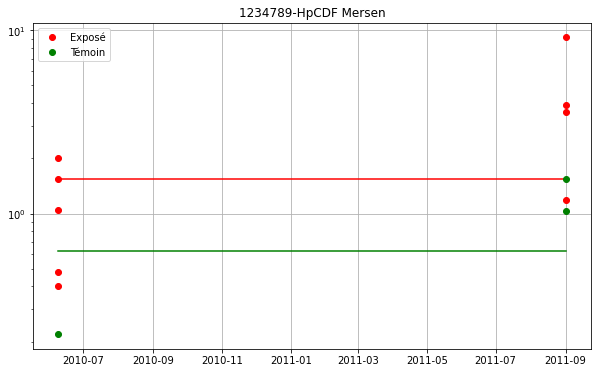

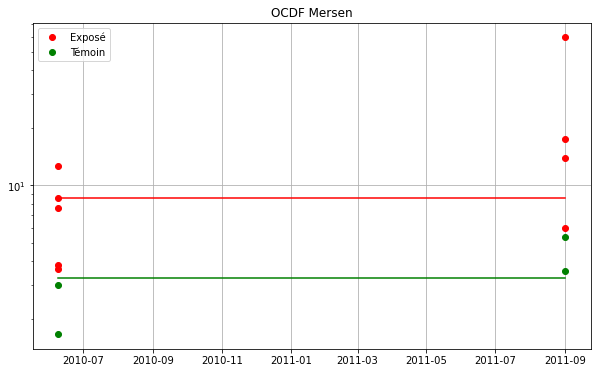

In [42]:
for sub in substances:
    f, ax = plt.subplots(figsize=(10, 6))
    plt.plot(b["Date"], b[sub].values, 'o',label="Exposé", color="r")
    plt.plot([min(b["Date"]), max(b["Date"])], [np.median(b[sub].values), np.median(b[sub].values)], color="r")
    plt.plot(c["Date"], c[sub].values, 'o',label="Témoin", color="g")
    plt.plot([min(c["Date"]), max(c["Date"])], [np.median(c[sub].values), np.median(c[sub].values)], color="g")
    plt.title(sub + " Mersen")
    plt.legend()
    plt.grid()
    plt.yscale("log")
    plt.show()
    data_rapport.append(["Novergie (pg/echantillon)", "Jauge", sub, np.median(b[sub].values), np.median(c[sub].values), np.divide(np.median(b[sub].values), np.median(c[sub].values))])

## VI.b Temporalité (Unité : pg/L)

In [43]:
b = data[(data["Nom du projet"] == "Novergie") & (data["Type de point de mesure"] == "Exposé") & (data["Unités"] == "pg/L") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)","Date de mesure :  Début"]].dropna()
b["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in b["Date de mesure :  Début"]]
b = b.sort_values(by=["Date"])

c = data[(data["Nom du projet"] == "Novergie") & (data["Type de point de mesure"] == "Témoin") & (data["Unités"] == "pg/L") & (data["Matrice"] == "Jauge")][substances + ["Distance à la source (km)", "Date de mesure :  Début"]].dropna()
c["Date"] = [dt.datetime.strptime(d,'%d/%m/%Y').date() for d in c["Date de mesure :  Début"]]
c = c.sort_values(by=["Date"])

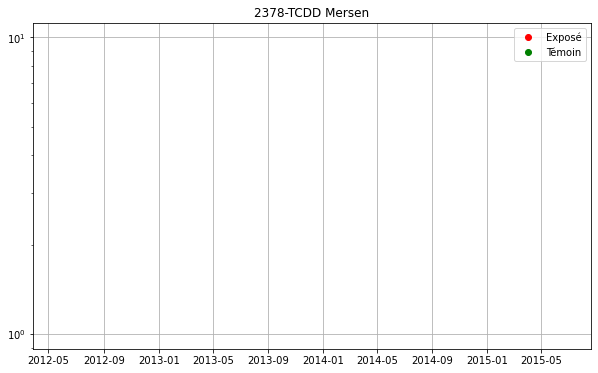

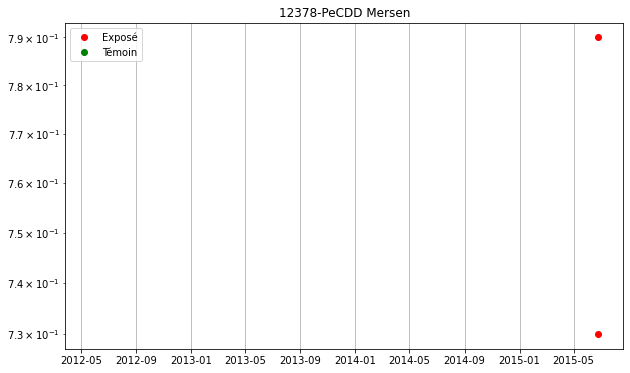

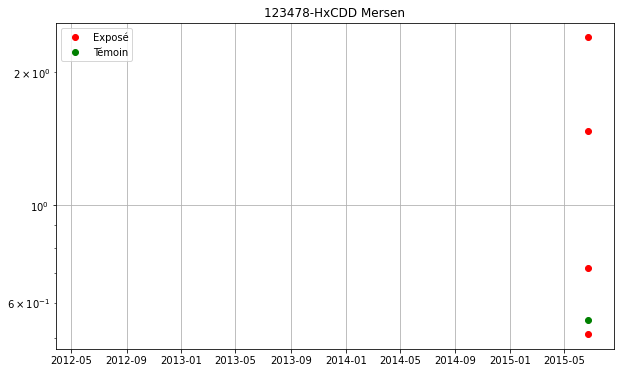

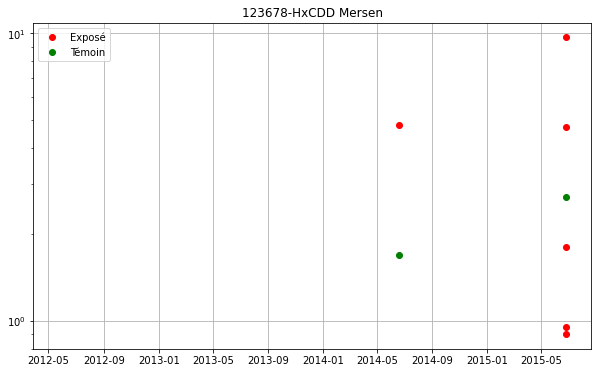

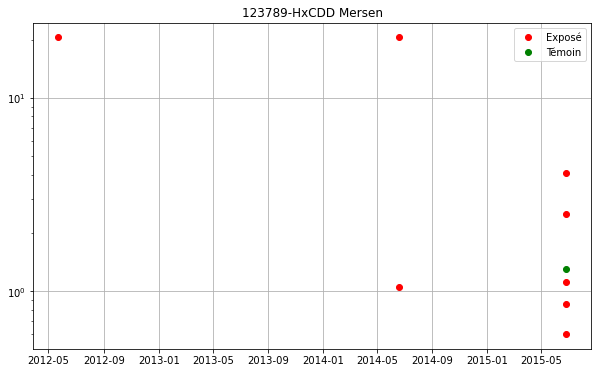

...

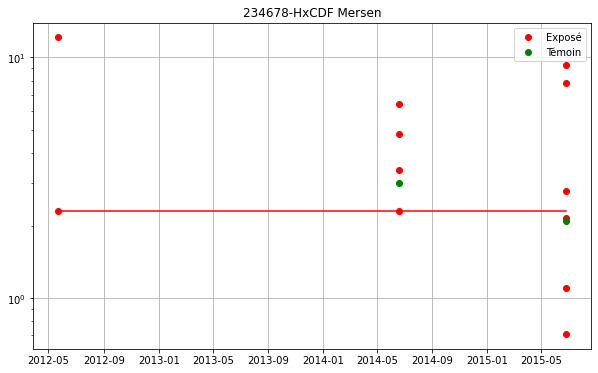

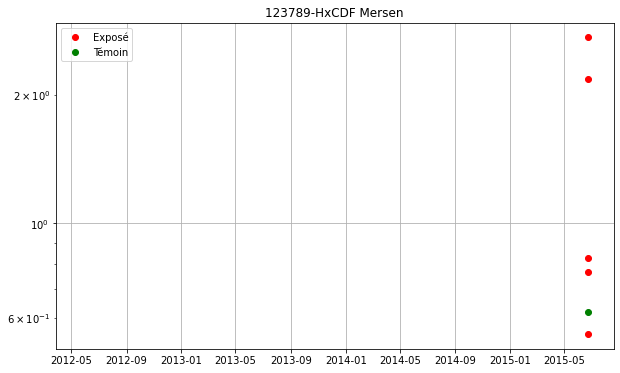

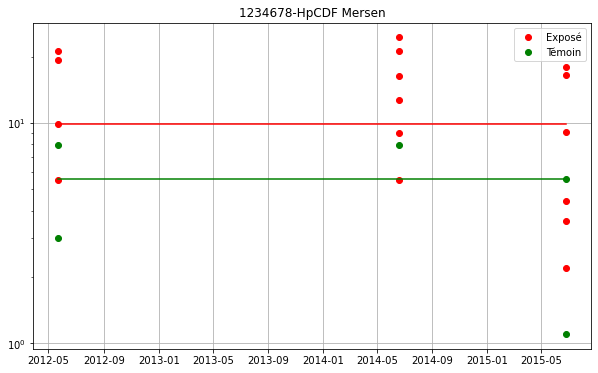

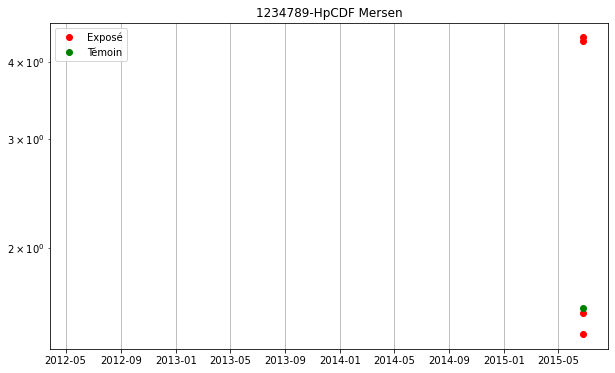

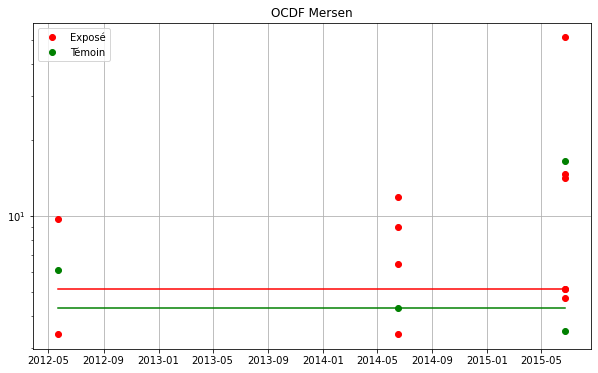

In [44]:
for sub in substances:
    f, ax = plt.subplots(figsize=(10, 6))
    plt.plot(b["Date"], b[sub].values, 'o',label="Exposé", color="r")
    plt.plot([min(b["Date"]), max(b["Date"])], [np.median(b[sub].values), np.median(b[sub].values)], color="r")
    plt.plot(c["Date"], c[sub].values, 'o',label="Témoin", color="g")
    plt.plot([min(c["Date"]), max(c["Date"])], [np.median(c[sub].values), np.median(c[sub].values)], color="g")
    plt.title(sub + " Mersen")
    plt.legend()
    plt.grid()
    plt.yscale("log")
    plt.show()
    data_rapport.append(["Novergie (pg/L)", "Jauge", sub, np.median(b[sub].values), np.median(c[sub].values), np.divide(np.median(b[sub].values), np.median(c[sub].values))])

## VI.c Tableau récapitulatif

In [46]:
df_rapport = pd.DataFrame(data = data_rapport, columns = ["Project", "Matrice", "Substance", "Exposé", "Témoin", "Rapport"])
df_final_rapport = df_rapport[(df_rapport["Project"] == "Novergie (pg/L)") | (df_rapport["Project"] == "Novergie (pg/echantillon)")].pivot(index="Substance", columns="Project", values='Rapport')
df_final_rapport.reindex(substances)

Project,Novergie (pg/L),Novergie (pg/echantillon)
Substance,,
2378-TCDD,NaN,NaN
12378-PeCDD,NaN,inf
123478-HxCDD,NaN,inf
123678-HxCDD,NaN,10.833333
123789-HxCDD,NaN,7.737705
1234678-HpCDD,2.329592,4.115021
OCDD,3.905493,2.814494
2378-TCDF,NaN,1.690813
12378-PeCDF,NaN,2.526316
